# ResolVI to address noise and biases in spatial transcriptomics

### Physalia scverse workshop — hands-on session (45 min)

In this tutorial we go through the steps of training resolVI for correction of cellular-resolution spatial transcriptomics data. resolVI addresses erroneous co-expression patterns introduced by cell segmentation errors, as well as unspecific background/diffusion in these technologies. We highly recommend optimizing cell segmentation *before* running resolVI, since better segmentation also yields better resolVI results — the two steps are complementary, not substitutes for one another.

To make the comparison with a "vanilla" deep generative model concrete, we will also fit a standard **scVI** model on the same data. This lets us contrast three representations of the data side by side:

1. A classical **PCA** embedding (no generative model, no batch/technical-noise correction).
2. A **scVI** latent space (a generative model of counts, but *not* spatial-aware — it does not know about segmentation errors or neighboring cells).
3. A **resolVI** latent space (spatially-aware generative model that explicitly models segmentation contamination and diffusion background).

We will also compare differential expression (DE) calls obtained from scVI vs. resolVI on the same two cell populations, to see how explicitly modeling spatial contamination changes which genes come out as significant.

#### Plan for this tutorial

1. Load the data.
2. Baseline: PCA-based UMAP (no correction).
3. Baseline: train (or load) a vanilla scVI model → UMAP after scVI.
4. Train an unsupervised and a (semi-)supervised resolVI model — **with model saving/loading**, so you can pick up a pretrained model instead of waiting for training.
5. Visualize the resolVI latent space.
6. Differential expression: **scVI vs. resolVI**, side by side.
7. Differential niche abundance (spatial neighborhoods) — a resolVI-only analysis.
8. Generate segmentation/background-corrected counts.
9. Transfer mapping of a query slice onto the trained reference model.

In [1]:
import os
import tempfile

import decoupler as dc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import torch

sc.set_figure_params(figsize=(4, 4))
save_dir = "results_tutorial_resolvi"
os.makedirs(save_dir, exist_ok=True)
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
%config InlineBackend.figure_format='retina'

scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)
print("GPU available:", torch.cuda.is_available())


/opt/homebrew/Caskroom/miniforge/base/envs/tangram/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Seed set to 0


Last run with scvi-tools version: 1.1.5
GPU available: False


## 1. Data loading

For this notebook we use a Xenium dataset of a mouse brain hemisphere pair. We use the **left hemisphere** for model training and the **right hemisphere** for transfer mapping later on.

The data was originally labeled using Leiden clustering on an optimized segmentation obtained with the [ProSeg](https://www.biorxiv.org/content/10.1101/2024.04.25.591218v1) algorithm, a scalable algorithm for transcriptome-informed segmentation. We treat these `predicted_celltype` labels, and the UMAP computed from them, as a "ground truth" reference to compare our own embeddings against.

In [2]:
adata_path = os.path.join(save_dir, "tutorial_xenium_brain.h5ad")
adata = sc.read(
    adata_path, backup_url="https://exampledata.scverse.org/scvi-tools/tutorial_xenium_brain.h5ad"
)
adata


100%|██████████| 170M/170M [00:27<00:00, 6.51MB/s]   


AnnData object with n_obs × n_vars = 130604 × 248
    obs: 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'fov', 'predicted_celltype'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'log1p'
    obsm: 'X_resolvi_transferred', 'X_spatial', 'X_umap_transferred'
    layers: 'counts'

Make sure a raw-counts layer is available. resolVI and scVI both need integer counts, not normalized/log data, so we keep a dedicated `counts` layer untouched throughout the notebook.

In [3]:
if "counts" not in adata.layers:
    adata.layers["counts"] = adata.X.copy()

adata.obs["predicted_celltype"].value_counts()


predicted_celltype
Astrocytes                            17315
Oligodendrocyte                       14567
Fibroblast                            10070
Endothelial Cells                      9775
Inhibitory Neurons Hypothalamus        9284
Excitatory Neurons Amygdala            8640
Excitatory Neurons Thalamus            7947
Excitatory Neurons L5                  7004
Excitatory Neurons L2/3                6393
Inhibitory Neurons Putamen             5753
Inhibitory Neurons Cortical            5711
Excitatory Neurons L4                  5500
Excitatory Neurons L6                  5052
Microglia                              4141
Oligodendrocyte Precursor Cells        3872
Excitatory Neurons Dentate Gyrus       3283
Excitatory Neurons Cornu ammonis       2787
Ependymal Cells                        2202
Inhibitory Neurons Pallidum             658
Excitatory Neurons Amygdala medial      650
Name: count, dtype: int64

We computed a UMAP after transferring labels from the ProSeg-segmented dataset while using the original segmentation here; we keep it around as ground truth to visually sanity-check our own embeddings against.

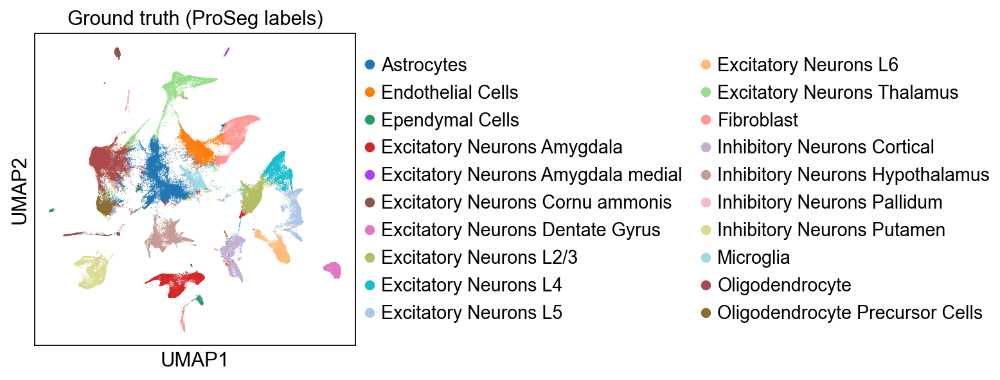

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/2095939985.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="predicted_celltype", spot_size=30)


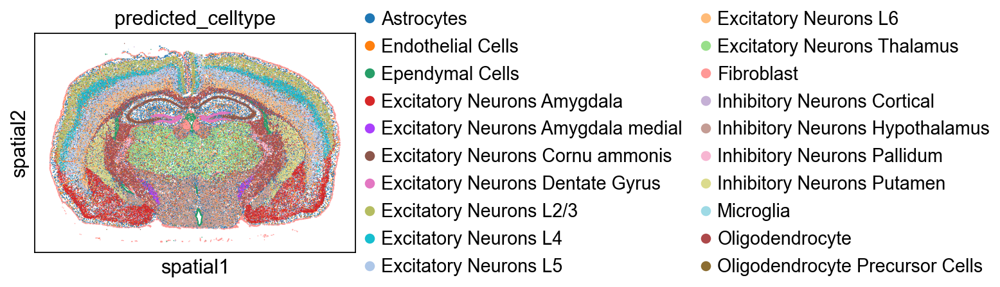

In [5]:
adata.obsm["X_umap"] = adata.obsm["X_umap_transferred"]
sc.pl.umap(adata, color="predicted_celltype", title="Ground truth (ProSeg labels)")
sc.pl.spatial(adata, color="predicted_celltype", spot_size=30)

## 2. Baseline: UMAP from PCA (no correction)

Before reaching for a deep generative model, let's look at what a completely standard scanpy pipeline gives us: normalize, log-transform, PCA, neighbors, UMAP. This is our reference point for "no correction at all" — segmentation contamination and diffusion background are still baked into the counts here.

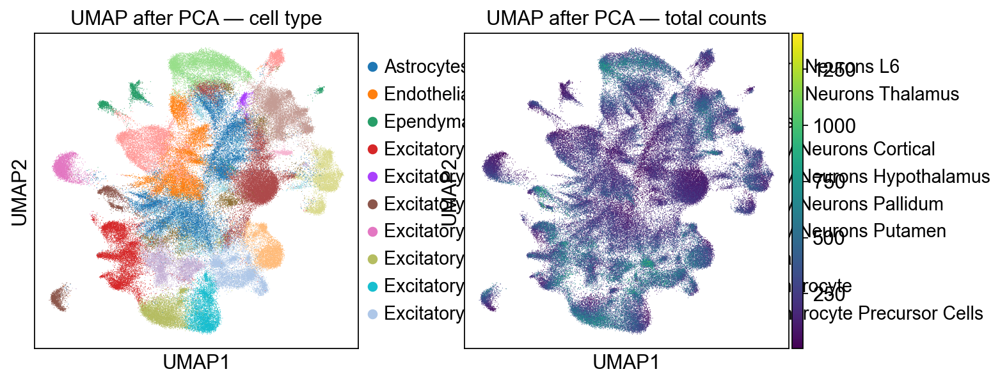

In [6]:
sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata, use_rep="X_pca")
sc.tl.umap(adata)

adata.obsm["X_pca"] = adata.obsm["X_pca"].copy()
adata.obsm["X_umap_pca"] = adata.obsm["X_umap"].copy()

sc.pl.umap(adata, color=["predicted_celltype", "total_counts"], title=["UMAP after PCA — cell type", "UMAP after PCA — total counts"])

Notice how strongly `total_counts` correlates with position in this embedding — a classic sign that technical variation (segmentation size, sequencing depth, diffusion background) is dominating the naive embedding rather than genuine biological differences between cell types.

## 3. Baseline: UMAP after scVI

Next, we fit a standard (non-spatial) **scVI** model directly on the raw counts. scVI models technical variation (library size, dispersion) explicitly as part of its generative model, so its latent space is usually already a lot cleaner than a PCA embedding — but it still has no notion of physical neighbors, segmentation contamination, or diffusion background, since it treats each cell's count vector independently.

As announced above, we follow a **train-once, reuse-many-times** pattern: set `RETRAIN = True` once to train and save the model, then set it back to `False` (the default) to just reload it in future sessions or on other machines.

In [8]:
RETRAIN_SCVI = False
scvi_model_dir = os.path.join(save_dir, "scvi_model")

scvi.model.SCVI.setup_anndata(adata, layer="counts")

if RETRAIN_SCVI or not os.path.exists(scvi_model_dir):
    scvi_model = scvi.model.SCVI(adata, gene_likelihood="nb")
    scvi_model.train(max_epochs=40, early_stopping=True)
    scvi_model.save(scvi_model_dir, overwrite=True)
    print(f"Trained scVI model and saved it to '{scvi_model_dir}'.")
else:
    scvi_model = scvi.model.SCVI.load(scvi_model_dir, adata=adata)
    print(f"Loaded pretrained scVI model from '{scvi_model_dir}'.")


/Users/can/Documents/scvi-tools/src/scvi/train/_trainrunner.py:98: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  accelerator, lightning_devices, device = parse_device_args(
GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/homebrew/Caskroom/miniforge/base/envs/tangram/lib/python3.12/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
/opt/homebrew/Caskroom/miniforge/base/envs/tangram/lib/python3.12/site-packages/lightning/pytorch/utilities/_pytree.p

Epoch 40/40: 100%|██████████| 40/40 [04:36<00:00,  6.81s/it, v_num=1, train_loss=200]

`Trainer.fit` stopped: `max_epochs=40` reached.


Epoch 40/40: 100%|██████████| 40/40 [04:36<00:00,  6.92s/it, v_num=1, train_loss=200]
Trained scVI model and saved it to 'results_tutorial_resolvi/scvi_model'.


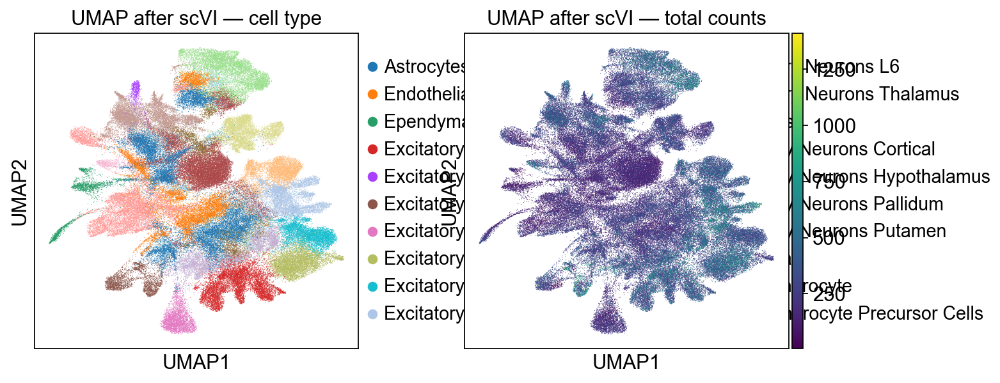

In [ ]:
adata.obsm["X_scVI"] = scvi_model.get_latent_representation(adata)
sc.pp.neighbors(adata, use_rep="X_scVI", key_added="scvi")
sc.tl.umap(adata, neighbors_key="scvi")
adata.obsm["X_umap_scvi"] = adata.obsm["X_umap"].copy()

sc.pl.umap(adata, color=["predicted_celltype", "total_counts"], title=["UMAP after scVI — cell type", "UMAP after scVI — total counts"])

**Compare the two UMAPs above** (PCA vs. scVI): the scVI embedding does not separates cell types more cleanly but depends less on `total_counts`, because scVI explicitly models count depth as a nuisance covariate. We will also see that scVI still inherits any segmentation contamination.

## 4. Splitting into reference and query

We use this dataset to set up an unsupervised and a (semi-)supervised resolVI model and train them. We split the dataset into right and left hemispheres to demonstrate query mapping later in the notebook.

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/1090802531.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="hemisphere", spot_size=30)


Epoch 4/200:   2%|▏         | 3/200 [09:29<10:23:29, 189.90s/it, v_num=1, train_loss=198]


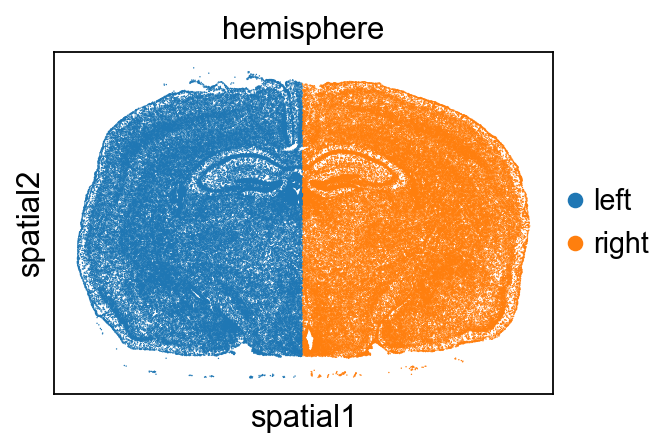

In [11]:
adata.obs["hemisphere"] = ["right" if x > 5000 else "left" for x in adata.obsm["X_spatial"][:, 0]]
sc.pl.spatial(adata, color="hemisphere", spot_size=30)

In [12]:
ref_adata = adata[adata.obs["hemisphere"] == "left"].copy()
query_adata = adata[adata.obs["hemisphere"] == "right"].copy()

## 5. Train (or load) the resolVI model

We need to register the AnnData object for use with resolVI. We can ignore the `batch_key` here because these cells don't have much batch effect to begin with — they are derived from a single slice. We do, however, give resolVI the cell type labels, since we train a **semi-supervised** model. Setting up the AnnData object computes spatial neighbors within each batch; this step can take a few minutes for very large datasets.

Just like scVI above, resolVI follows the load-if-available / train-and-save-otherwise pattern.

In [13]:
RETRAIN_RESOLVI = False
resolvi_model_dir = os.path.join(save_dir, "resolvi_model")

scvi.external.RESOLVI.setup_anndata(ref_adata, labels_key="predicted_celltype", layer="counts")

if RETRAIN_RESOLVI or not os.path.exists(resolvi_model_dir):
    supervised_resolvi = scvi.external.RESOLVI(ref_adata, semisupervised=True)
    supervised_resolvi.train(max_epochs=50)
    supervised_resolvi.save(resolvi_model_dir, overwrite=True)
    print(f"Trained resolVI model and saved it to '{resolvi_model_dir}'.")
else:
    supervised_resolvi = scvi.external.RESOLVI.load(resolvi_model_dir, adata=ref_adata)
    print(f"Loaded pretrained resolVI model from '{resolvi_model_dir}'.")


INFO     Generating sequential column names                                                                        
INFO     Generating sequential column names                                                                        


/Users/can/Documents/scvi-tools/src/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/2918701686.py:7: FutureWarning: RESOLVI is a spatial transcriptomics model that will be moved to the scvi-tools spatial companion package `scviva-tools` starting in scvi-tools v1.5 and will no longer be supported here. It will be deprecated from scvi-tools in v1.6.
  supervised_resolvi = scvi.external.RESOLVI(ref_adata, semisupervised=True)
/Users/can/Documents/scvi-tools/src/scvi/train/_trainrunner.py:98: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  accelerator, lightning_devices, device = parse_

Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/Users/can/Documents/scvi-tools/src/scvi/external/resolvi/_module.py:383: UserWarning: Converting a tensor with requires_grad=True to a scalar may lead to unexpected behavior.
Consider using tensor.detach() first. (Triggered internally at /Users/runner/work/pytorch/pytorch/torch/csrc/autograd/generated/python_variable_methods.cpp:839.)
  concentration=torch.tensor(


Epoch 50/50: 100%|██████████| 50/50 [13:46<00:00, 16.37s/it, v_num=1, elbo_train=6.26e+7]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [13:46<00:00, 16.53s/it, v_num=1, elbo_train=6.26e+7]
Trained resolVI model and saved it to 'results_tutorial_resolvi/resolvi_model'.


**A note on pyro and the parameter store.** resolVI uses Pyro under the hood. Pyro keeps its parameters in a global `pyro_param_store`, and only a single model can be "active" at a time — e.g. after training/loading the query model further below, the reference model's parameters get overwritten and `supervised_resolvi` is no longer valid for inference. If you need to go back and forth between models, reload the one you need right before using it.

Now we can predict cell type labels using the trained model and extract its latent space.

In [14]:
ref_adata.obsm["resolvi_celltypes"] = supervised_resolvi.predict(
    ref_adata, num_samples=3, soft=True
)


/Users/can/Documents/scvi-tools/src/scvi/model/base/_pyromixin.py:511: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


Sampling local variables, batch: 100%|██████████| 133/133 [00:26<00:00,  5.08it/s]


In [ ]:
ref_adata.obs["resolvi_predicted"] = ref_adata.obsm["resolvi_celltypes"].idxmax(axis=1)
ref_adata.obsm["X_resolVI"] = supervised_resolvi.get_latent_representation(ref_adata)

/Users/can/Documents/scvi-tools/src/scvi/external/resolvi/_utils.py:64: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


## 6. Visualize the resolVI latent space.

Again, we may visualize the latent space as well as the inferred labels, this time for the resolVI model.

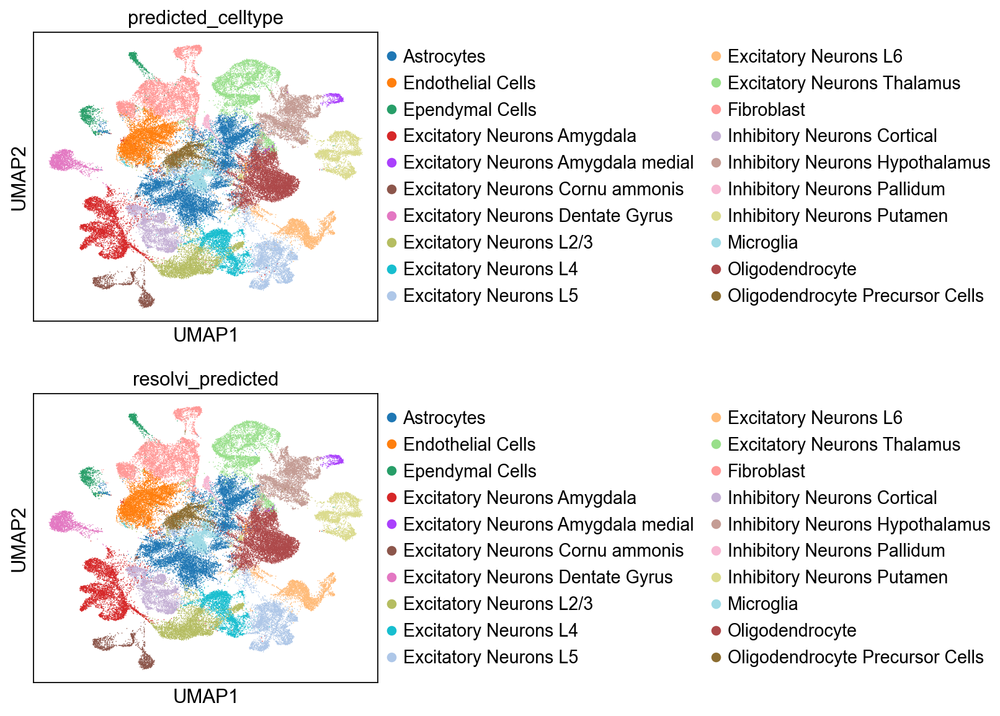

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/2355550776.py:5: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(ref_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30, ncols=1)


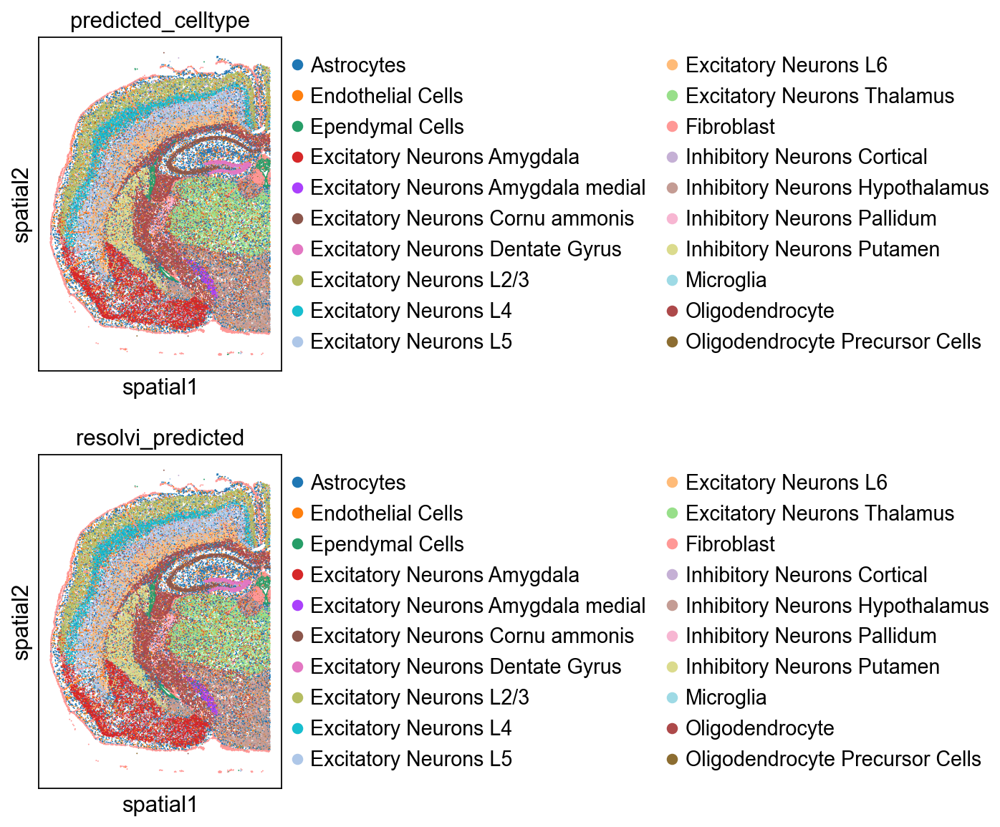

In [22]:
sc.pp.neighbors(ref_adata, use_rep="X_resolVI")
sc.tl.umap(ref_adata)

sc.pl.umap(ref_adata, color=["predicted_celltype", "resolvi_predicted"], ncols=1)
sc.pl.spatial(ref_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30, ncols=1)

> **Hands-on checkpoint 1.** Compare this UMAP (resolVI, left hemisphere only) with the scVI UMAP from Section 3 (computed on both hemispheres). Do the same cell types cluster together in both? Which embedding looks "cleaner" to you, and why might that be, given what resolVI additionally models?

## 7. Differential expression: scVI vs. resolVI

We now compare differential expression (DE) between two closely related excitatory neuron populations (layer 6 vs. layer 5), computed **twice**: once with scVI (which sees only the raw, potentially contaminated counts) and once with resolVI (which explicitly separates true signal from segmentation contamination and background before testing).

### 7a. resolVI differential expression

We can use the trained resolVI model to perform differential expression between two groups of cells. This uses a test similar to the scVI DE test, but importantly, both do not test for a difference in means between the two groups; instead it tests for differences between random pairs of single cells.

In [94]:
de_result_resolvi = supervised_resolvi.differential_expression(
    ref_adata,
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L5",
    group2="Excitatory Neurons Thalamus",
    weights="importance",
    pseudocounts=1e-2,
    mode="change",
    test_mode="three",
)
de_result_resolvi.head(5)


/Users/can/Documents/scvi-tools/src/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(


DE...:   0%|          | 0/1 [00:00<?, ?it/s]

/Users/can/Documents/scvi-tools/src/scvi/external/resolvi/_utils.py:194: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


DE...: 100%|██████████| 1/1 [00:47<00:00, 47.24s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Arc,0.9986,0.0014,6.569875,0.024988,0.000335,0.01,0.25,8.038470,8.563272,2.036304,...,8.526102,0.199541,0.961963,0.135749,239.784256,6.633577,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Necab2,0.9976,0.0024,6.029880,0.000741,0.011891,0.01,0.25,-4.256978,-4.278858,1.202961,...,0.216922,4.418630,0.174201,0.919622,6.598492,126.521935,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Dkk3,0.9974,0.0026,5.949637,0.034816,0.000227,0.01,0.25,9.505330,10.257776,2.462774,...,13.275742,0.099005,0.969129,0.084205,361.024994,3.163149,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Meis2,0.9956,0.0044,5.421739,0.008239,0.000069,0.01,0.25,8.331528,8.773253,1.781748,...,3.128954,0.120439,0.810639,0.105894,88.254341,3.621343,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Satb2,0.9898,0.0102,4.575114,0.013286,0.000162,0.01,0.25,6.365859,6.464643,1.095614,...,4.323534,0.066854,0.917585,0.061495,121.244614,1.989526,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus


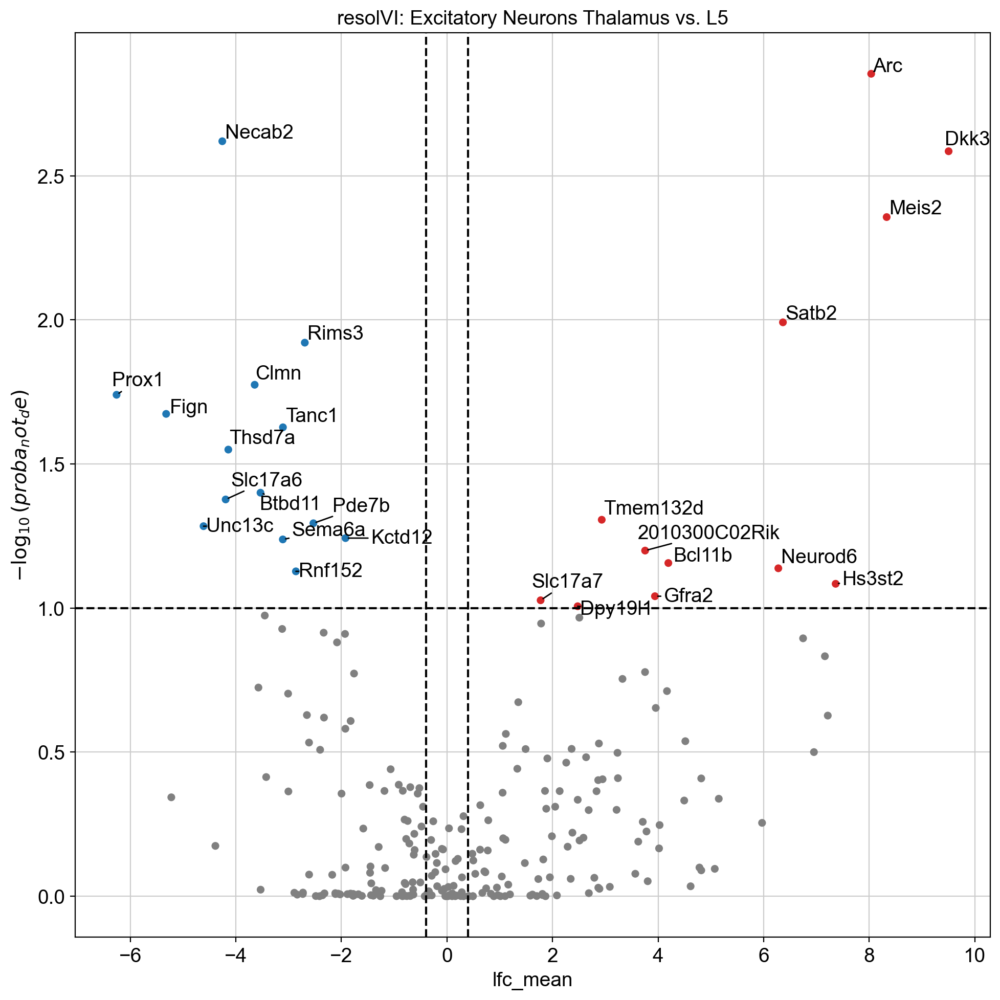

In [95]:
dc.pl.volcano(
    de_result_resolvi,
    x="lfc_mean",
    y="proba_not_de",
    thr_sign=0.1,
    thr_stat=0.4,
    top=30,
    figsize=(10, 10),
)
plt.gca().set_title("resolVI: Excitatory Neurons Thalamus vs. L5")
plt.show()


### 7b. scVI differential expression, same groups

Now we run scVI's built-in DE test (a Bayesian test comparable in spirit to the resolVI one, but on the raw, uncorrected counts) on the exact same two groups, using the resolVI-derived cell-type labels so the comparison is apples-to-apples.

In [96]:
de_result_scvi = scvi_model.differential_expression(
    adata=ref_adata,
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L5",
    group2="Excitatory Neurons Thalamus",
    pseudocounts=1e-2,
    mode="change",
    test_mode="three",
)
de_result_scvi.head(5)


DE...: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
Dkk3,1.0000,0.0000,18.420681,0.033138,0.000397,0.01,0.25,7.124360,7.285548,1.596181,...,13.275742,0.099005,0.969129,0.084205,361.024994,3.163149,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Neurod6,0.9998,0.0002,8.516943,0.023530,0.000290,0.01,0.25,6.559209,6.613156,1.501127,...,8.300891,0.075274,0.951213,0.069405,229.644669,2.120712,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Satb2,0.9996,0.0004,7.823621,0.011481,0.000223,0.01,0.25,6.126359,6.197418,1.360981,...,4.323534,0.066854,0.917585,0.061495,121.244614,1.989526,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Arc,0.9992,0.0008,7.130086,0.025206,0.000826,0.01,0.25,5.478578,5.570016,1.487594,...,8.526102,0.199541,0.961963,0.135749,239.784256,6.633577,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus
Necab2,0.9982,0.0018,6.318161,0.000726,0.013246,0.01,0.25,-4.469582,-4.502990,1.183221,...,0.216922,4.418630,0.174201,0.919622,6.598492,126.521935,True,Excitatory Neurons L5 vs Excitatory Neurons Th...,Excitatory Neurons L5,Excitatory Neurons Thalamus


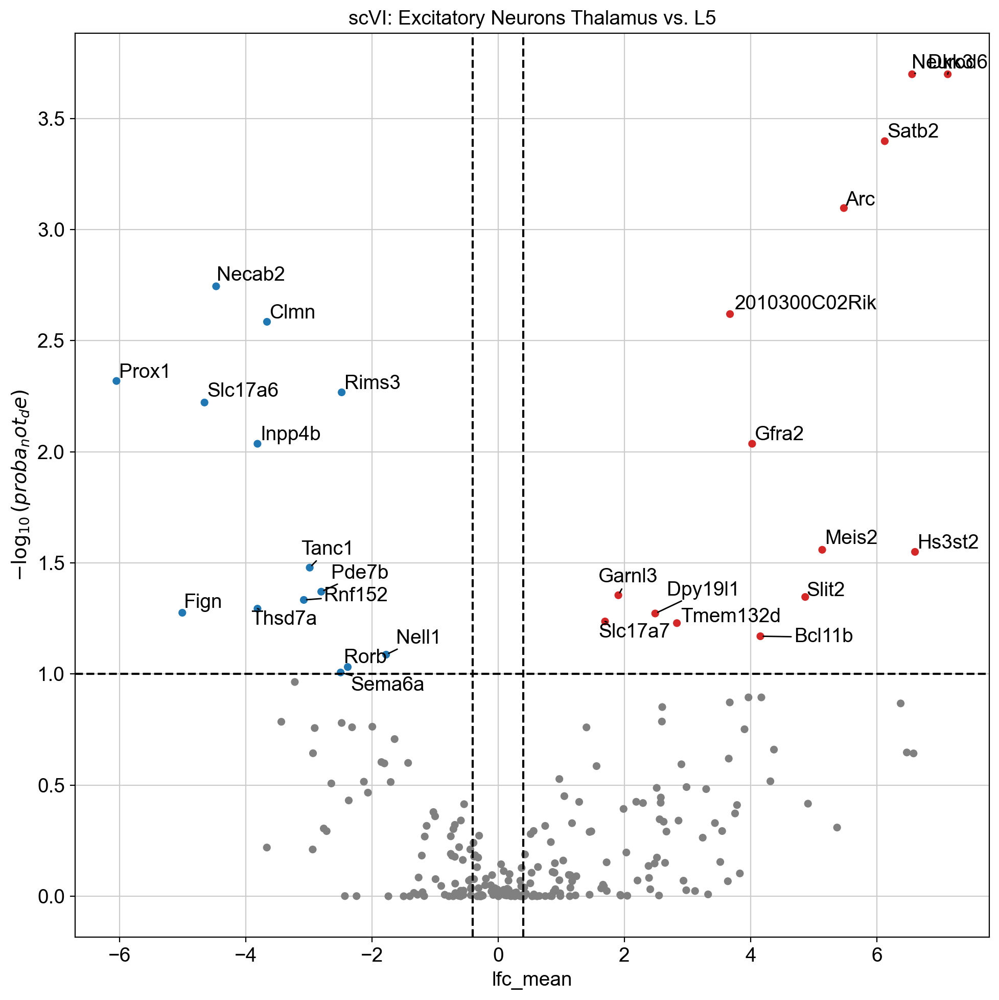

In [97]:
dc.pl.volcano(
    de_result_scvi,
    x="lfc_mean",
    y="proba_not_de",
    thr_sign=0.1,
    thr_stat=0.4,
    top=30,
    figsize=(10, 10),
)
plt.gca().set_title("scVI: Excitatory Neurons Thalamus vs. L5")
plt.show()


### 7c. Side-by-side comparison

Let's directly compare the two gene rankings: how many of the top significant genes are shared between the scVI and resolVI calls, and which genes are unique to one method?

In [98]:
def top_genes(df, n=20, stat_col="proba_de", lfc_col="lfc_mean", thr_stat=0.4, thr_sign=0.1):
    sig = df[(df[stat_col] > thr_stat) & (df[lfc_col].abs() > thr_sign)]
    return set(sig.sort_values(stat_col, ascending=False).head(n).index)

resolvi_top = top_genes(de_result_resolvi)
scvi_top = top_genes(de_result_scvi)

shared = resolvi_top & scvi_top
only_resolvi = resolvi_top - scvi_top
only_scvi = scvi_top - resolvi_top

print(f"Top genes shared by both methods ({len(shared)}):\n  {sorted(shared)}\n")
print(f"Top genes only in resolVI ({len(only_resolvi)}):\n  {sorted(only_resolvi)}\n")
print(f"Top genes only in scVI ({len(only_scvi)}):\n  {sorted(only_scvi)}")

Top genes shared by both methods (13):
  ['2010300C02Rik', 'Arc', 'Clmn', 'Dkk3', 'Meis2', 'Necab2', 'Pde7b', 'Prox1', 'Rims3', 'Satb2', 'Slc17a6', 'Tanc1', 'Thsd7a']

Top genes only in resolVI (7):
  ['Bcl11b', 'Btbd11', 'Fign', 'Kctd12', 'Sema6a', 'Tmem132d', 'Unc13c']

Top genes only in scVI (7):
  ['Garnl3', 'Gfra2', 'Hs3st2', 'Inpp4b', 'Neurod6', 'Rnf152', 'Slit2']


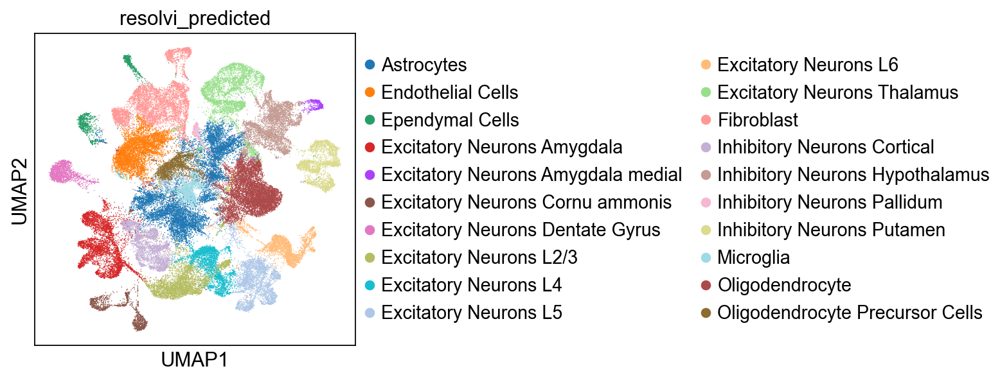

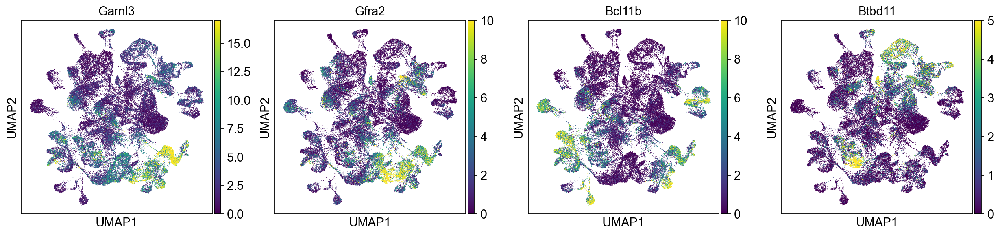

In [99]:
genes_to_check = sorted(only_scvi)[:2] + sorted(only_resolvi)[:2]
genes_to_check = [g for g in genes_to_check if g in ref_adata.var_names]
sc.pl.umap(ref_adata, color="resolvi_predicted")
if genes_to_check:
    sc.pl.umap(ref_adata, color=genes_to_check, layer="counts", vmax="p98")


> **Hands-on checkpoint 2.** Genes that show up as significant in scVI but *not* in resolVI are good candidates for genes whose apparent differential expression is driven by segmentation contamination or diffusion background rather than true biology — resolVI "explains it away". Pick one or two such genes from `only_scvi` above and inspect them spatially with `sc.pl.spatial`. Do they look diffuse / bleeding across cell boundaries?
>
> Try re-running Section 7 with a different pair of `group1` / `group2` cell types (see `ref_adata.obs["resolvi_predicted"].value_counts()` for available labels) and see whether the scVI/resolVI agreement changes.

## 8. Differential niche abundance (resolVI only)

Because resolVI models the spatial neighborhood of each cell, it can also test whether cell states are enriched or depleted in the neighborhood of other cell states — something a non-spatial model like scVI simply cannot do, since it has no access to physical coordinates. We find here that excitatory neurons in the thalamus and cortex preferentially colocalize with themselves as well as with adjacent-layer neurons.

In [100]:
da = supervised_resolvi.differential_niche_abundance(
    groupby="resolvi_predicted",
    group1="Excitatory Neurons L4",
    group2="Excitatory Neurons Thalamus",
    neighbor_key="index_neighbor",
    test_mode="three",
    delta=0.05,
    pseudocounts=3e-2,
)
da.head(5)


/Users/can/Documents/scvi-tools/src/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(


DE...:   0%|          | 0/1 [00:00<?, ?it/s]

/Users/can/Documents/scvi-tools/src/scvi/model/base/_pyromixin.py:511: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


DE...: 100%|██████████| 1/1 [00:26<00:00, 26.03s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,is_de_fdr_0.05,comparison,group1,group2
Excitatory Neurons L4,0.9962,0.0038,5.568944,0.476306,0.000370,0.03,0.05,11.629520,12.250303,2.368119,-1.949664,15.017735,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons Thalamus,0.9952,0.0048,5.334326,0.000332,0.515798,0.03,0.05,-12.548469,-13.332537,2.148115,-14.949261,2.504254,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Excitatory Neurons L2/3,0.9140,0.0860,2.363483,0.085267,0.000109,0.03,0.05,8.315549,8.297743,3.174525,-3.077360,14.592777,True,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Oligodendrocyte,0.6914,0.3086,0.806673,0.021587,0.102681,0.03,0.05,-5.598171,-6.688967,6.196893,-14.670711,12.524147,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus
Inhibitory Neurons Cortical,0.6408,0.3592,0.578838,0.083976,0.000526,0.03,0.05,7.296144,10.549400,5.386549,-12.479321,14.253346,False,Excitatory Neurons L4 vs Excitatory Neurons Th...,Excitatory Neurons L4,Excitatory Neurons Thalamus


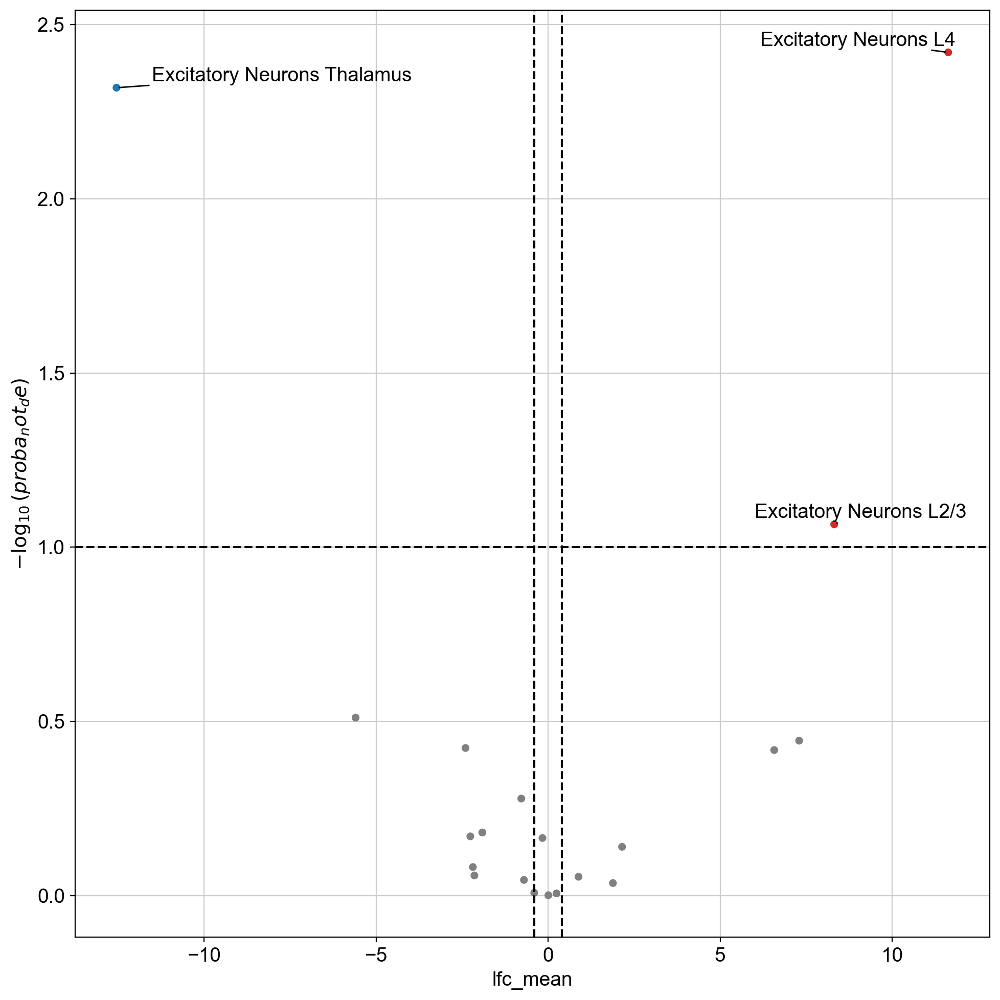

In [101]:
dc.pl.volcano(
    da,
    x="lfc_mean",
    y="proba_not_de",
    thr_sign=0.1,
    thr_stat=0.4,
    top=30,
    figsize=(10, 10),
)
plt.show()


## 9. Generating segmentation- and background-corrected counts

We can also generate counts corrected for reads erroneously assigned from neighboring cells due to missegmentation, as well as for unspecific background. We use custom `num_samples` and `summary_fun` parameters to accelerate computation. `px_rate` from `model_corrected` produces corrected count data; `mixture_proportions` from `model_residuals` gives, for each cell, the fraction of counts attributable to `true` signal, `diffusion` from neighbors, and unspecific `background`. `summary_frequency` controls how many posterior draws are accumulated before computing the summary statistic.

To increase the amount of correction, use a lower quantile instead of the median.

In [102]:
samples_corr = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_corrected,
    return_sites=["px_rate"],
    summary_fun={"post_sample_q50": np.median},
    num_samples=3,
    summary_frequency=30,
)
samples_corr = pd.DataFrame(samples_corr).T


/Users/can/Documents/scvi-tools/src/scvi/model/base/_pyromixin.py:511: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


Sampling local variables, batch: 100%|██████████| 520/520 [00:47<00:00, 10.98it/s]


In [103]:
samples = supervised_resolvi.sample_posterior(
    model=supervised_resolvi.module.model_residuals,
    return_sites=["mixture_proportions"],
    summary_fun={"post_sample_means": np.mean},
    num_samples=3,
    summary_frequency=100,
)
samples = pd.DataFrame(samples).T


/Users/can/Documents/scvi-tools/src/scvi/model/base/_pyromixin.py:511: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


Sampling local variables, batch: 100%|██████████| 520/520 [00:45<00:00, 11.53it/s]


In [104]:
ref_adata.obs[["true_proportion", "diffusion_proportion", "background_proportion"]] = samples.loc[
    "post_sample_means", "mixture_proportions"
]


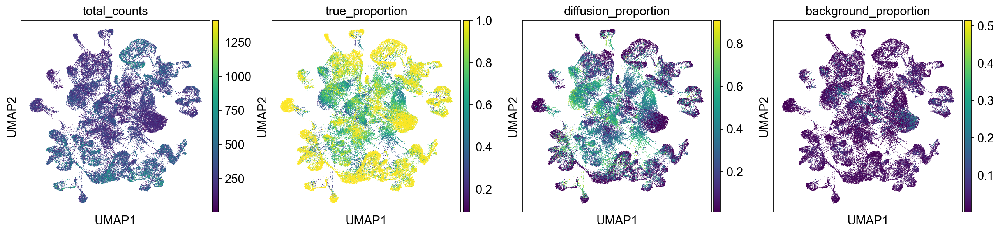

In [105]:
sc.pl.umap(
    ref_adata,
    color=["total_counts", "true_proportion", "diffusion_proportion", "background_proportion"],
)


In [106]:
ref_adata.layers["generated_expression"] = samples_corr.loc["post_sample_q50", "px_rate"]


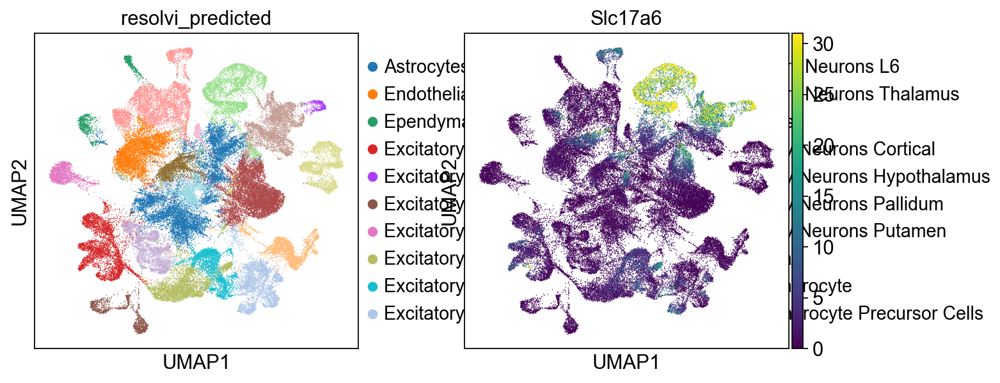

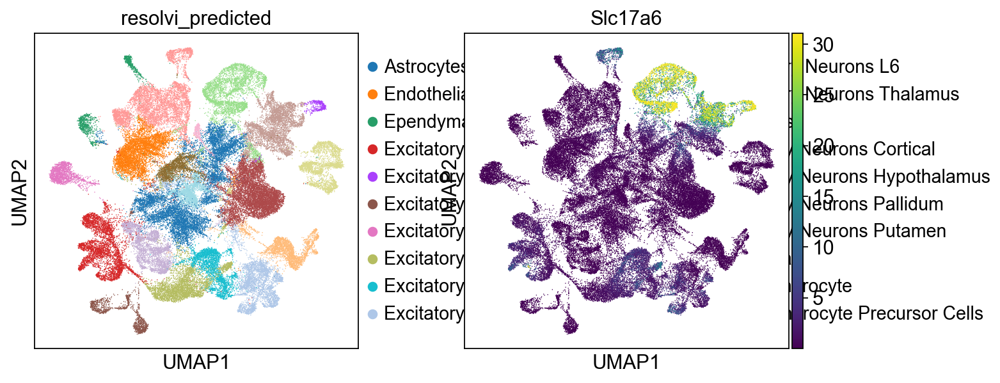

In [107]:
sc.pl.umap(ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="counts", vmax="p98")
sc.pl.umap(
    ref_adata, color=["resolvi_predicted", "Slc17a6"], layer="generated_expression", vmax="p98"
)


> **Hands-on checkpoint 3.** Swap `Slc17a6` for one of the genes you flagged in checkpoint 2 (a gene that was "explained away" by resolVI). Does the corrected expression pattern look more spatially specific than the raw counts?

## 10. Query transfer

We can map the reference model onto query data to reannotate it. resolVI relies on observation names for its non-amortized parameters, so it is important that cell names are unique between the query and reference datasets. We set the cell type to `"unknown"` for the query cells, so that resolVI has to predict the cell type by leveraging the reference model — and we again follow the load-or-train-and-save pattern for the query model.

In [108]:
query_adata.obs["predicted_celltype"] = "unknown"
query_adata.obs_names = [f"query_{i}" for i in query_adata.obs_names]


In [109]:
RETRAIN_QUERY = False
resolvi_query_model_dir = os.path.join(save_dir, "resolvi_query_model")

supervised_resolvi.prepare_query_anndata(query_adata, reference_model=supervised_resolvi)

if RETRAIN_QUERY or not os.path.exists(resolvi_query_model_dir):
    query_resolvi = supervised_resolvi.load_query_data(query_adata, reference_model=supervised_resolvi)
    query_resolvi.train(max_epochs=20)
    query_resolvi.save(resolvi_query_model_dir, overwrite=True)
    print(f"Trained query resolVI model and saved it to '{resolvi_query_model_dir}'.")
else:
    query_resolvi = scvi.external.RESOLVI.load(resolvi_query_model_dir, adata=query_adata)
    print(f"Loaded pretrained query resolVI model from '{resolvi_query_model_dir}'.")


INFO     Found 100.0% reference vars in query data.                                                                


/Users/can/Documents/scvi-tools/src/scvi/model/base/_archesmixin.py:119: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(
/Users/can/Documents/scvi-tools/src/scvi/data/fields/_dataframe_field.py:227: UserWarning: Category 66457 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/Users/can/Documents/scvi-tools/src/scvi/model/base/_save_load.py:158: FutureWarning: RESOLVI is a spatial transcriptomics model that will be moved to the scvi-tools spatial companion package `scviva-tools` starting in scvi-tools v1.5 and will no longer be supported here. It will be deprecated from scvi-tools in v1.6.
  model = cls(adata, **non_kwargs, **kwargs)
/Users/can/Documents/scvi-tools/src/scvi/train/_train

Running scArches. Set lr to 0 and blocking variables.
Epoch 20/20: 100%|██████████| 20/20 [05:11<00:00, 15.38s/it, v_num=1, elbo_train=6.49e+7]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [05:11<00:00, 15.56s/it, v_num=1, elbo_train=6.49e+7]
Trained query resolVI model and saved it to 'results_tutorial_resolvi/resolvi_query_model'.


In [110]:
query_adata.obs["resolvi_predicted"] = query_resolvi.predict(
    query_adata, num_samples=3, soft=False
)
query_adata.obsm["X_resolVI"] = query_resolvi.get_latent_representation(query_adata)


/Users/can/Documents/scvi-tools/src/scvi/model/base/_pyromixin.py:511: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


Sampling local variables, batch: 100%|██████████| 129/129 [00:24<00:00,  5.24it/s]


/Users/can/Documents/scvi-tools/src/scvi/external/resolvi/_utils.py:64: UserWarning: `accelerator` has been automatically set to `cpu` although 'mps' exists. If you wish to run on mps backend, use explicitly accelerator='mps' in train function.In future releases it will become default for mps supported machines.
  _, _, device = parse_device_args(


Again, we may visualize the latent space as well as the inferred labels for the query hemisphere.

In [111]:
sc.pp.neighbors(query_adata, use_rep="X_resolVI")
sc.tl.umap(query_adata)

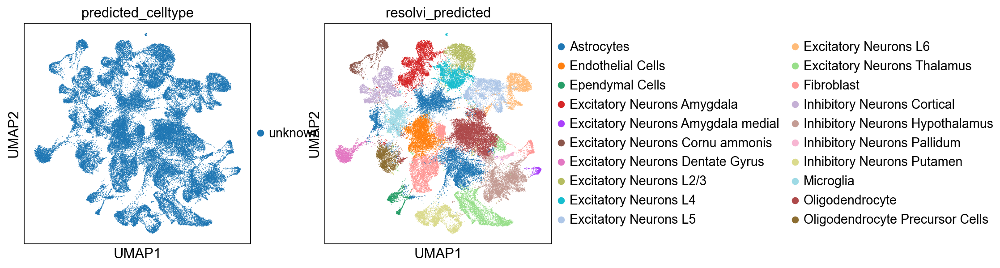

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/1669651559.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(query_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)


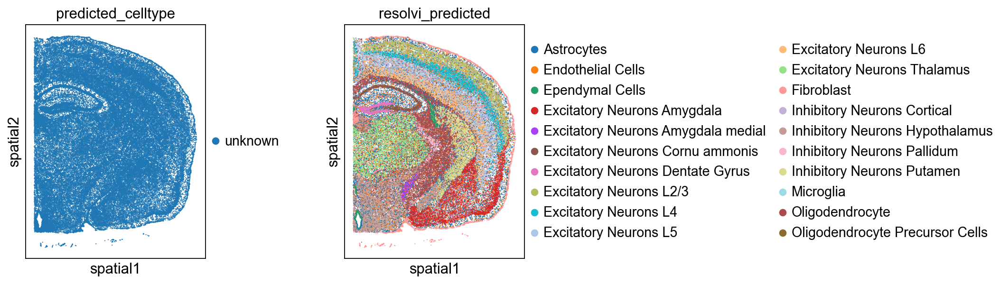

In [112]:
sc.pl.umap(query_adata, color=["predicted_celltype", "resolvi_predicted"])
sc.pl.spatial(query_adata, color=["predicted_celltype", "resolvi_predicted"], spot_size=30)

We can now concatenate the reference and query datasets again and check that we get good integration and accurate cell-type transfer across the two hemispheres.

In [113]:
full_adata = ref_adata.concatenate(
    query_adata, batch_key="source", batch_categories=["reference", "query"]
)


/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/1467899425.py:1: FutureWarning: The method concatenate is deprecated and will be removed in the future. Use anndata.concat instead of AnnData.concatenate. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  full_adata = ref_adata.concatenate(


In [114]:
sc.pp.neighbors(full_adata, use_rep="X_resolVI")
sc.tl.umap(full_adata)


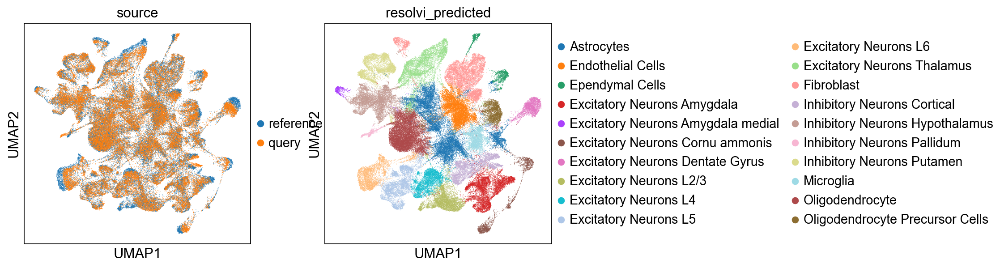

/var/folders/pd/bhrbdgds4bz_wcyvl809mlbw0000gn/T/ipykernel_2002/2959526523.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(full_adata, color=["source", "resolvi_predicted"], spot_size=30)


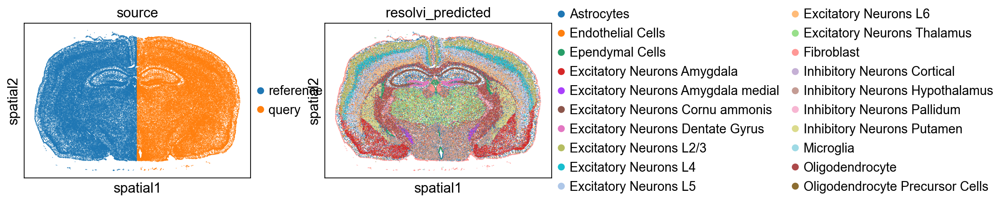

In [115]:
sc.pl.umap(full_adata, color=["source", "resolvi_predicted"])
sc.pl.spatial(full_adata, color=["source", "resolvi_predicted"], spot_size=30)


## Wrap-up

In this session, we:

* Contrasted three embeddings of the same tissue — PCA, scVI, and resolVI — and saw how each additional layer of modeling (technical noise, then spatial contamination) changes the picture.
* Trained resolVI (and scVI) once, saved the models to disk, and reloaded them — the pattern you'll want to use any time you revisit an analysis or share a trained model with a collaborator.
* Compared DE calls from scVI and resolVI on the same two cell populations, and saw that resolVI's explicit contamination model changes which genes are called significant.
* Used resolVI-specific analyses — differential niche abundance and corrected counts — that are only possible because resolVI is spatially aware.
* Mapped a query hemisphere onto a trained reference model.

### Where to go from here

* Try the same pipeline on your own Xenium/MERSCOPE/CosMx data — the main requirements are a raw counts layer and spatial coordinates in `.obsm`.
* Explore `scvi.external.RESOLVI` unsupervised mode (`semisupervised=False`) if you don't have reliable cell-type labels to start from.
* Read the [resolVI preprint](https://www.biorxiv.org/) and the [scviva-tools documentation](https://docs.scviva-tools.org/) for more on the model and its parameters.